# Uploading Dataset

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import shutil
from PIL import Image
import time
import cv2
import random
import gc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics
from tensorflow.keras.layers import Dense, Reshape, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.applications.mobilenet import preprocess_input



1.   Mounting from google drive



In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
!ls "/content/drive/MyDrive/Campus_Landmarks_Dataset_Group3"

annotations  dataset_description.txt  images


In [ ]:
# !cp -r "/content/drive/My Drive/Campus_Landmarks_Dataset_Group3" /content/
# # Copy Dataset to Colab's Local Storage


2.  Saving Path & Categories for Further Use



In [4]:
dataset_path = "/content/drive/MyDrive/Campus_Landmarks_Dataset_Group3"

# Read the annotation file
annotations = pd.read_csv(os.path.join(dataset_path, "annotations/annotations.csv"))
print(annotations.head())

# List available categories (folders)
categories = sorted(os.listdir(os.path.join(dataset_path, "images")))
print("Categories:", categories)

  Image Filename Building Name
0       A-01.jpg             A
1       A-02.jpg             A
2       A-03.jpg             A
3       A-04.jpg             A
4       A-05.jpg             A
Categories: ['A', 'B', 'C', 'D', 'E', 'F']


# Preprocessing Images

1.   Data Augmentation



In [30]:
output_folder = '/content/augmented_images'
# Delete the previous output folder (if it exists)
if os.path.exists(output_folder):
    shutil.rmtree(output_folder)
    print(f"Deleted the previous folder: {output_folder}")


Deleted the previous folder: /content/test_images


In [ ]:
# ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='reflect'  # to avoid stretched edges
)

def augment_images(folder_path, save_to_folder, num_augmented_images=4):
    if not os.path.exists(save_to_folder):
        os.makedirs(save_to_folder)

    # Get all image files in the folder
    image_files = os.listdir(folder_path)
    image_files = [f for f in image_files if f.endswith('.jpg') or f.endswith('.png')]

    total_augmented = 0  # Track total generated images
    # Load each image and apply augmentation
    for i, img_file in enumerate(image_files):
        img_path = os.path.join(folder_path, img_file)
        try:
          img = Image.open(img_path)
          img.verify()  # Check if the image is corrupt
          img = load_img(img_path)
          print(f"{img_file} is valid")
        except Exception as e:
            print(f"Skipping {img_file}: {e}")
            continue
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate augmented images
        aug_iter = datagen.flow(img_array, batch_size=1, save_to_dir=save_to_folder,  save_prefix=f'aug{i}', save_format='jpg')

        count = 0  # Track images per original
        # Save augmented images
        for j in range(num_augmented_images):
            _ = next(aug_iter)  # Generate one augmented image
            count += 1

        del img, img_array, aug_iter
        gc.collect()

        print(f"{img_file}: {count} augmented images generated")  # Debug output
        total_augmented += count

    print(f"Total images generated: {total_augmented} (Expected: {len(image_files) * num_augmented_images})")


    check_orientation_and_aspect_ratio(save_to_folder, folder_path)

def check_orientation_and_aspect_ratio(save_to_folder, original_folder_path):
    generated_images = [f for f in os.listdir(save_to_folder) if f.endswith('.jpg') or f.endswith('.png')]

    for img_file in generated_images:
        img_path = os.path.join(save_to_folder, img_file)
        img = Image.open(img_path)

        # Check aspect ratio and orientation
        width, height = img.size
        if width > height:  # If the image is landscape, rotate it back to portrait
            img = img.rotate(-90, expand=True)

        img.save(img_path)

    # After correcting orientation, append to the original folder with the appropriate naming convention
    save_to_original(original_folder_path, save_to_folder)

def save_to_original(original_folder_path, augmented_folder_path):
    # Get all the original images and augmented images
    original_images = sorted([f for f in os.listdir(original_folder_path) if f.endswith('.jpg') or f.endswith('.png')])
    augmented_images = sorted([f for f in os.listdir(augmented_folder_path) if f.endswith('.jpg') or f.endswith('.png')])

    print(f"\n Number of original images: {len(original_images)}")
    print(f"Number of augmented images to append: {len(augmented_images)}\n")


    # Determine the next available file number in the original folder
    max_index = 0
    for img_file in original_images:
        if img_file.endswith('.jpg') or img_file.endswith('.png'):
            try:
                index = int(img_file.split('-')[1].split('.')[0])  # Get the numeric part after "-"
                max_index = max(max_index, index)
            except ValueError:
                pass

    for i, aug_img in enumerate(augmented_images):
        new_filename = f"{original_folder_path.split('/')[-1]}-{max_index + i + 1:02d}.jpg"
        src_path = os.path.join(augmented_folder_path, aug_img)
        dest_path = os.path.join(original_folder_path, new_filename)

        if os.path.exists(dest_path):
            print(f"File {new_filename} already exists.")

        try:
          shutil.copy(src_path, dest_path)
          print(f"Copied: {new_filename}")
        except Exception as e:
            print(f"Error copying {new_filename}:{e}")

    print(f"Appended {len(augmented_images)} augmented images to {original_folder_path}")

for category in categories:
    image_folder = os.path.join(dataset_path, 'images', category)
    save_folder = f'/content/augmented_images/{category}'
    augment_images(image_folder, save_folder, num_augmented_images=4)


A-14.jpg is valid
A-14.jpg: 4 augmented images generated
A-37.jpg is valid
A-37.jpg: 4 augmented images generated
A-17.jpg is valid
A-17.jpg: 4 augmented images generated
A-13.jpg is valid
A-13.jpg: 4 augmented images generated
A-26.jpg is valid
A-26.jpg: 4 augmented images generated
A-10.jpg is valid
A-10.jpg: 4 augmented images generated
A-39.jpg is valid
A-39.jpg: 4 augmented images generated
A-15.jpg is valid
A-15.jpg: 4 augmented images generated
A-16.jpg is valid
A-16.jpg: 4 augmented images generated
A-21.jpg is valid
A-21.jpg: 4 augmented images generated
A-09.jpg is valid
A-09.jpg: 4 augmented images generated
A-03.jpg is valid
A-03.jpg: 4 augmented images generated
A-27.jpg is valid
A-27.jpg: 4 augmented images generated
A-08.jpg is valid
A-08.jpg: 4 augmented images generated
A-01.jpg is valid
A-01.jpg: 4 augmented images generated
A-11.jpg is valid
A-11.jpg: 4 augmented images generated
A-31.jpg is valid
A-31.jpg: 4 augmented images generated
A-32.jpg is valid
A-32.jpg: 4 a

2.   Applying Filters



In [5]:
def adjust_lighting(img): #  Contrast Limited Adaptive Histogram Equalization for adjusting lighting/contrast adaptively
    # separating lightness (L) from color (A and B) in LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)

    # enhanced L, and the original color channels merged back
    merged = cv2.merge((cl, a, b))
    enhanced = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
    return enhanced

In [6]:
def random_blur(img):
  return cv2.GaussianBlur(img, (5, 5), 0) # 5 by 5 kernel and 0 sigmaX (automatically choose blur strength)

In [7]:
output_path = '/content/processed_images'

for category in categories:
    category_folder = os.path.join(dataset_path, "images", category)
    img_files = [f for f in os.listdir(category_folder) if f.endswith('.jpg') or f.endswith('.png')]

    for img_name in img_files:
        img_path = os.path.join(category_folder, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue  # Skip unreadable files

        img = adjust_lighting(img)

        # Randomly apply blur (e.g., 30% of the time)
        if random.random() < 0.3:
            img = random_blur(img)

        save_folder = os.path.join(output_path, category)
        os.makedirs(save_folder, exist_ok=True)
        cv2.imwrite(os.path.join(save_folder, img_name), img)

3.   Data Resizing & Normalization



In [8]:
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to 224x224 (square) as it is expected size for mobilenet
    img_array = image.img_to_array(img)  # Convert to NumPy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dims for batch
    img_array = preprocess_input(img_array)  # Normalize for MobileNet (-1 to 1)
    return img_array

In [9]:
label_map = {label: idx for idx, label in enumerate(categories)}
inverse_label_map = {v: k for k, v in label_map.items()}
print(label_map, inverse_label_map)

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5} {0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F'}


4. Splitting Dataset



In [10]:
# Function to preprocess all images in the dataset and save them into train/val/test sets
def preprocess_and_save_dataset(dataset_path, split_ratio=(0.7, 0.2, 0.1)):
    images = []
    labels = []

    for category in categories:
        category_folder = os.path.join(dataset_path, category)
        img_files = os.listdir(category_folder)
        img_files = [f for f in img_files if f.endswith('.jpg') or f.endswith('.png')]

        # Iterate over each image file in the category
        for img_file in img_files:
            img_path = os.path.join(category_folder, img_file)
            img_array = preprocess_image(img_path)
            images.append(img_array)
            labels.append(label_map[category])

    # Convert images and labels to numpy arrays
    images = np.vstack(images)
    labels = np.array(labels)

    X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=1-split_ratio[0], stratify=labels)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=split_ratio[2]/(split_ratio[1]+split_ratio[2]), stratify=y_temp)

    return X_train, y_train, X_val, y_val, X_test, y_test

X_train, y_train, X_val, y_val, X_test, y_test = preprocess_and_save_dataset(output_path)

# Model Architecture



1.   MobileNet Pretrained Model Details



In [20]:
mobile = tf.keras.applications.mobilenet.MobileNet()
mobile.summary()

Model: "mobilenet_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 4,253,864 (16.23 MB)

 Trainable params: 4,231,976 (16.14 MB)

 Non-trainable params: 21,888 (85.50 KB)


2.   Defining Updated Architecture



In [21]:
x = mobile.layers[-5].output
x = tf.keras.layers.Reshape(target_shape=(1024,))(x) # flatenning the 2nd last layer
output = Dense(units=6, activation='softmax')(x)  # 6 units because 6 possible output classes

In [22]:
model = Model(inputs=mobile.input, outputs=output)
for layer in model.layers[:-22]: # we will be training only the last 22 layers on our buildings dataset
    layer.trainable = False
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,235,014 (12.34 MB)

 Trainable params: 1,868,806 (7.13 MB)

 Non-trainable params: 1,366,208 (5.21 MB)

In [23]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])



3. Setting Shape According to Expected Shape By Model



In [15]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (1067, 224, 224, 3)
Shape of X_val: (305, 224, 224, 3)
Shape of X_test: (153, 224, 224, 3)
Shape of y_train: (1067,)
Shape of y_val: (305,)
Shape of y_test: (153,)


In [16]:
print("Unique values in y_train before encoding:", np.unique(y_train))
print("Unique values in y_val before encoding:", np.unique(y_val))
print("Unique values in y_test before encoding:", np.unique(y_test))

Unique values in y_train before encoding: [0 1 2 3 4 5]
Unique values in y_val before encoding: [0 1 2 3 4 5]
Unique values in y_test before encoding: [0 1 2 3 4 5]


In [17]:
# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=6)
y_val = to_categorical(y_val, num_classes=6)
y_test = to_categorical(y_test, num_classes=6)

print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of y_test:", y_test.shape)

Shape of y_train: (1067, 6)
Shape of y_val: (305, 6)
Shape of y_test: (153, 6)


# Training & Testing



1.   Training



In [24]:
batch_size = 16

model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=(X_val, y_val),
    epochs=30,
    verbose=2  # Show training progress
)

Epoch 1/30
66/66 - 94s - 1s/step - accuracy: 0.6979 - loss: 0.8967 - val_accuracy: 0.5705 - val_loss: 1.5904
Epoch 2/30
66/66 - 21s - 320ms/step - accuracy: 0.8182 - loss: 0.4711 - val_accuracy: 0.5705 - val_loss: 1.5714
Epoch 3/30
66/66 - 126s - 2s/step - accuracy: 0.9867 - loss: 0.1694 - val_accuracy: 0.8295 - val_loss: 0.4577
Epoch 4/30
66/66 - 22s - 328ms/step - accuracy: 1.0000 - loss: 0.1048 - val_accuracy: 0.8328 - val_loss: 0.4555
Epoch 5/30
66/66 - 120s - 2s/step - accuracy: 0.9962 - loss: 0.0852 - val_accuracy: 0.9574 - val_loss: 0.1522
Epoch 6/30
66/66 - 14s - 214ms/step - accuracy: 1.0000 - loss: 0.0552 - val_accuracy: 0.9639 - val_loss: 0.1502
Epoch 7/30
66/66 - 92s - 1s/step - accuracy: 1.0000 - loss: 0.0462 - val_accuracy: 0.9672 - val_loss: 0.1195
Epoch 8/30
66/66 - 21s - 320ms/step - accuracy: 1.0000 - loss: 0.0375 - val_accuracy: 0.9672 - val_loss: 0.1195
Epoch 9/30
66/66 - 119s - 2s/step - accuracy: 1.0000 - loss: 0.0287 - val_accuracy: 0.9770 - val_loss: 0.1021
Epoc


2.   Testing



In [25]:
predictions = model.predict(X_test, verbose=2)

# predictions will contain probabilities for each class, for each sample --> argmax of that means max of probabilities
predicted_classes = predictions.argmax(axis=1)  # Getting the predicted class for each sample
print(predicted_classes)

5/5 - 11s - 2s/step
[5 4 3 4 3 5 2 3 3 0 1 2 5 1 0 2 3 1 3 4 4 4 2 5 4 2 0 5 4 4 3 0 0 3 2 2 5
 0 1 0 3 4 2 1 4 0 0 2 2 0 1 4 2 4 2 2 1 2 2 3 3 4 0 2 1 5 3 0 3 5 0 2 3 1
 3 5 1 0 5 4 5 0 0 1 2 5 1 3 1 2 2 4 3 1 5 1 1 5 4 1 3 4 4 1 0 1 4 1 3 4 5
 1 0 4 1 4 5 1 5 2 0 0 1 5 3 5 4 1 0 2 5 3 3 4 4 1 2 2 3 3 5 5 4 0 0 2 2 5
 4 0 4 0 0]


3. Results

In [26]:
y_test_classes = y_test.argmax(axis=1)

print("Test accuracy:", accuracy_score(y_test_classes, predicted_classes))

Test accuracy: 0.9673202614379085


In [27]:
# Classification Report (Precision, Recall, F1-Score, etc.)
report = classification_report(y_true=y_test_classes, y_pred=predicted_classes)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98        25
           1       1.00      0.96      0.98        27
           2       0.88      0.96      0.92        24
           3       1.00      0.96      0.98        25
           4       0.96      1.00      0.98        27
           5       1.00      0.92      0.96        25

    accuracy                           0.97       153
   macro avg       0.97      0.97      0.97       153
weighted avg       0.97      0.97      0.97       153



4. Confusion Matrix

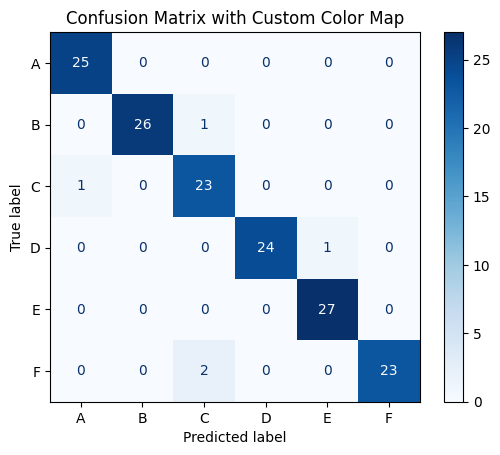

In [28]:
actual = np.random.binomial(1,.9,size = 1000)
predicted = np.random.binomial(1,.9,size = 1000)

confusion_matrix = metrics.confusion_matrix(y_test_classes, predicted_classes)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['A', 'B', 'C', 'D', 'E', 'F'])

cm_display.plot(cmap='Blues')
plt.title("Confusion Matrix with Custom Color Map")
plt.show()

5. Further Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


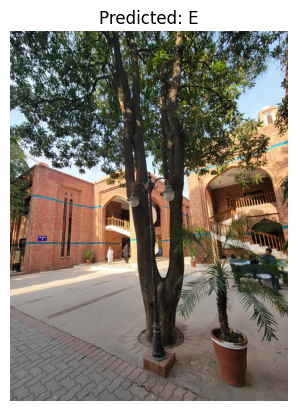

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


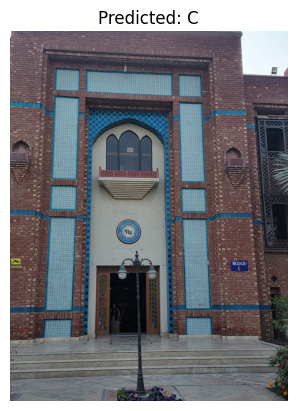

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


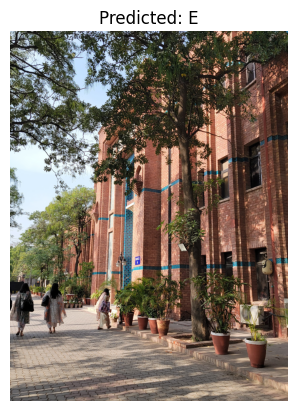

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


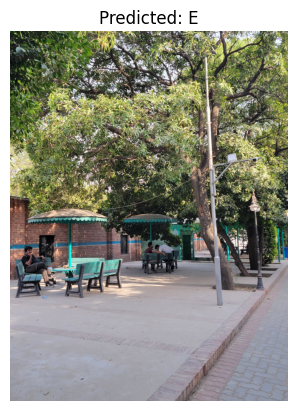

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


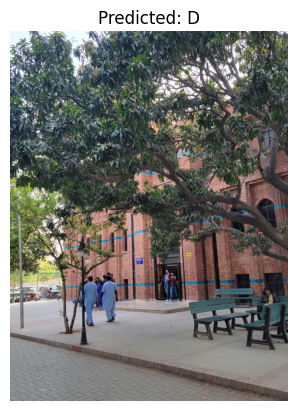

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


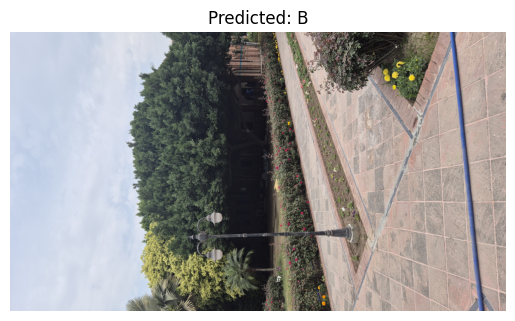

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


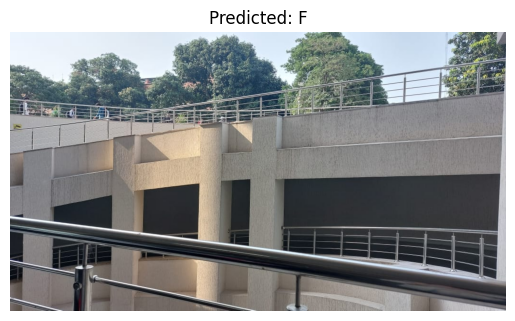

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


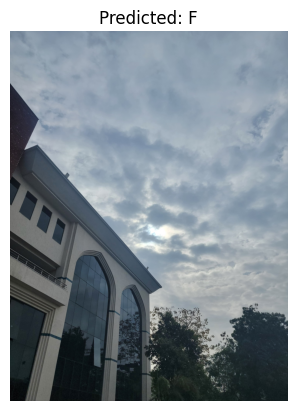

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


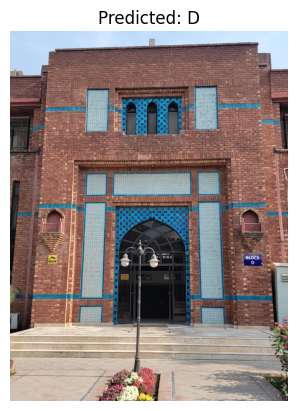

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


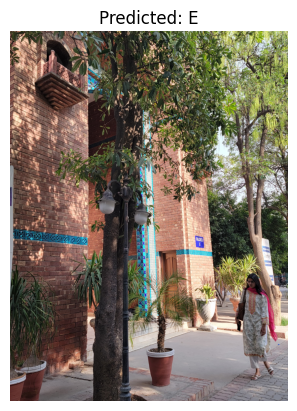

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


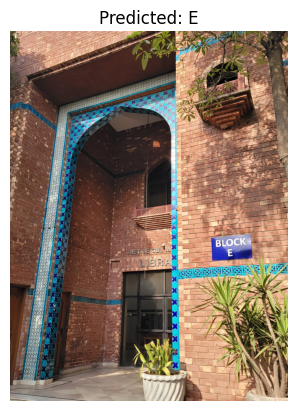

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


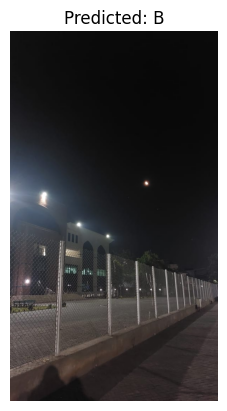

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


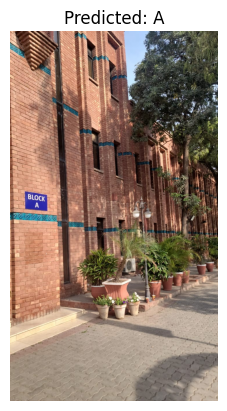

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


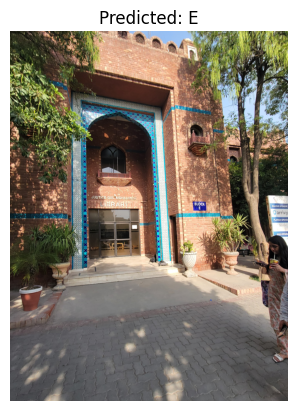

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


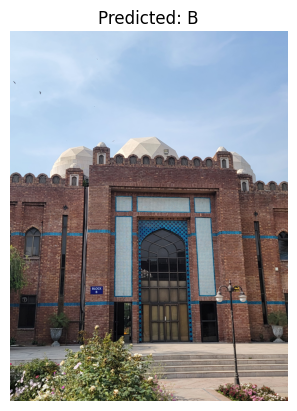

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


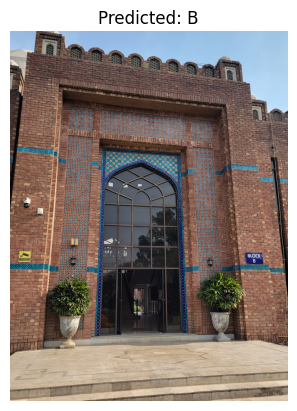

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


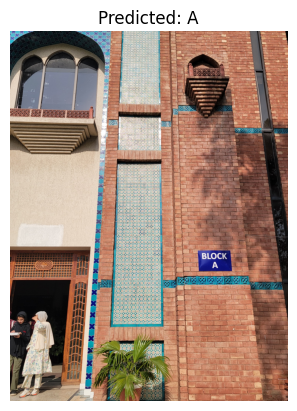

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


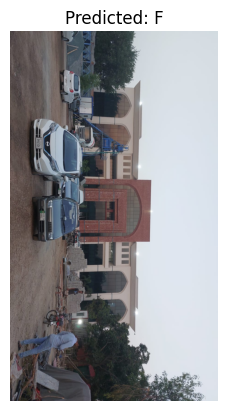

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


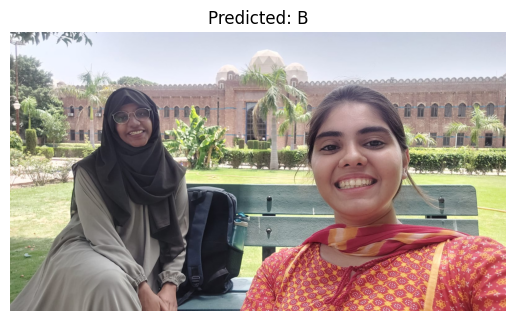

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


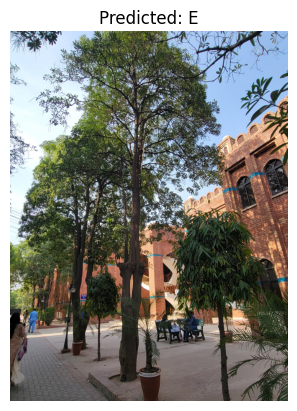

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


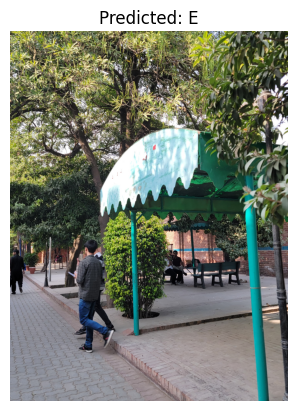

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


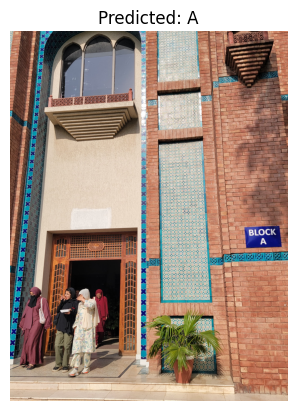

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


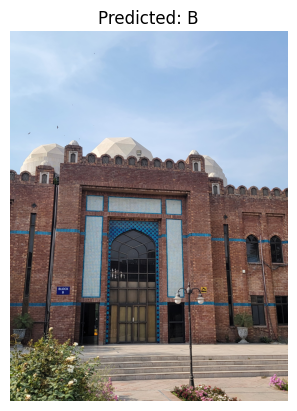

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


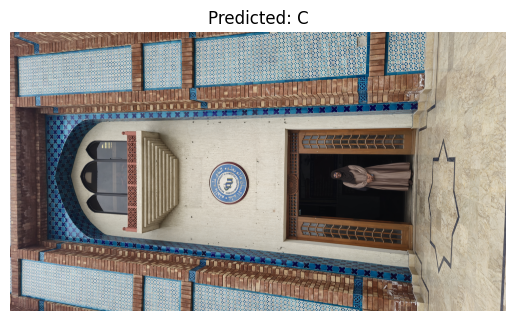

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


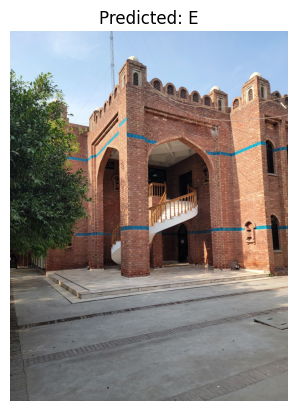

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


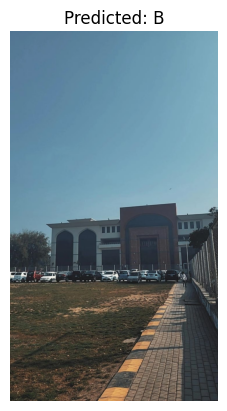

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


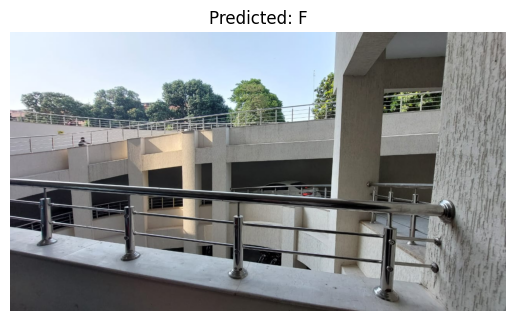

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


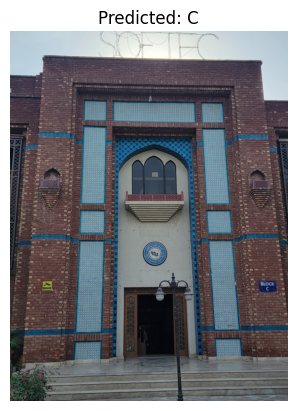

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


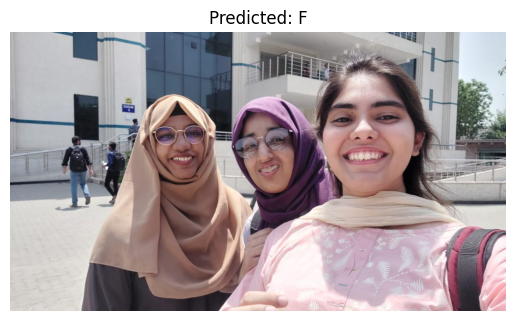

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


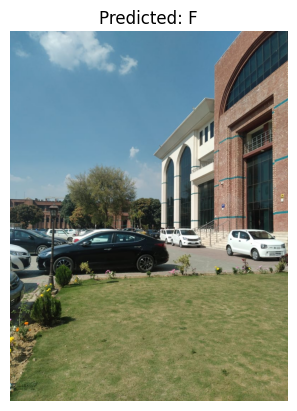

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


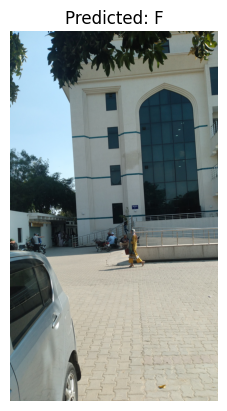

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


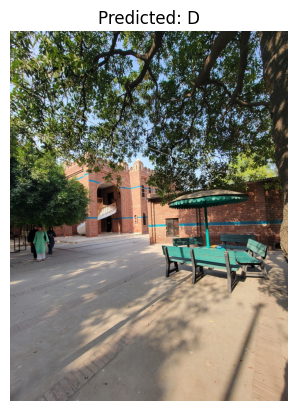

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


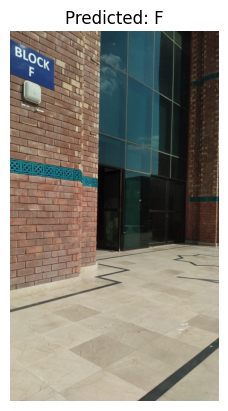

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


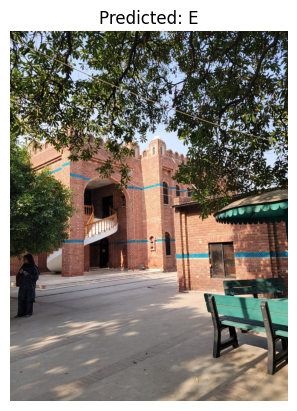

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


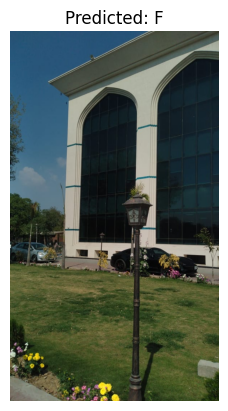

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


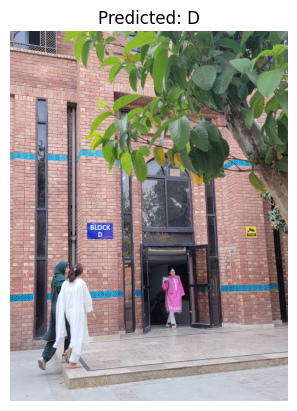

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


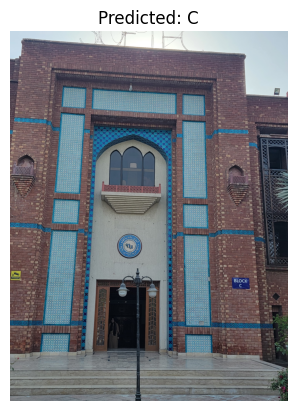

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


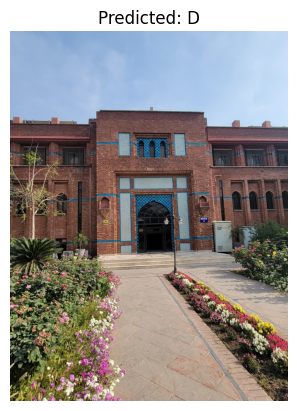

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


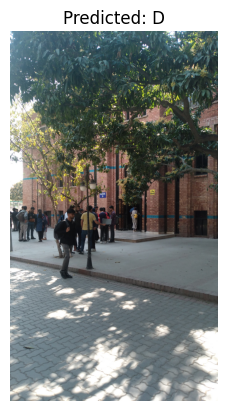

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


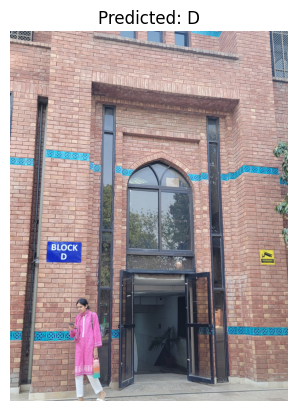

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


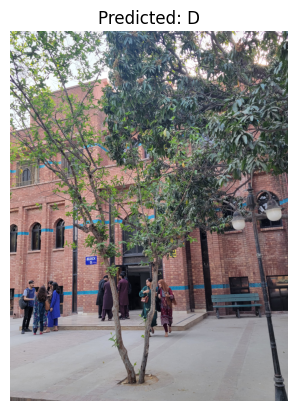

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


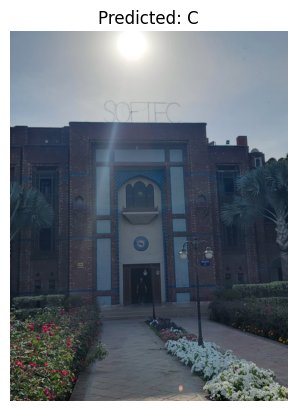

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


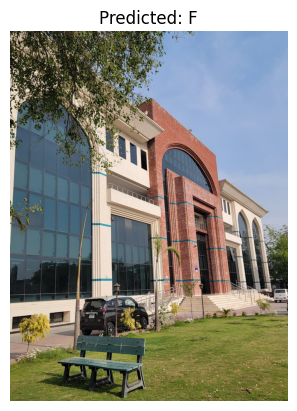

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


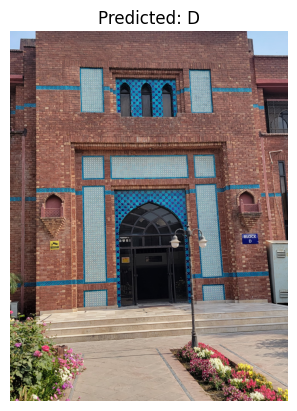

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


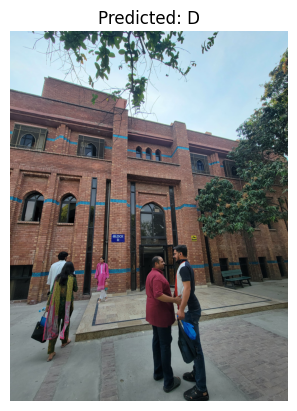

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


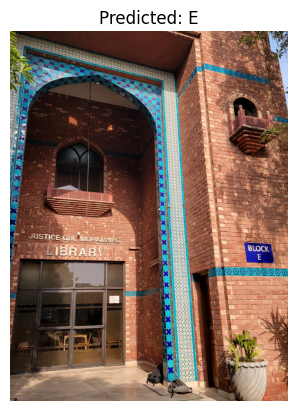

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


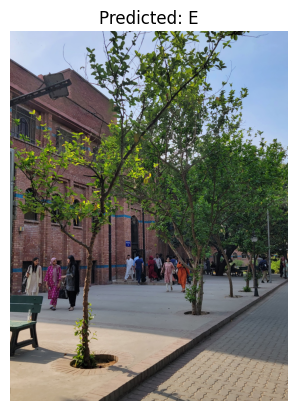

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


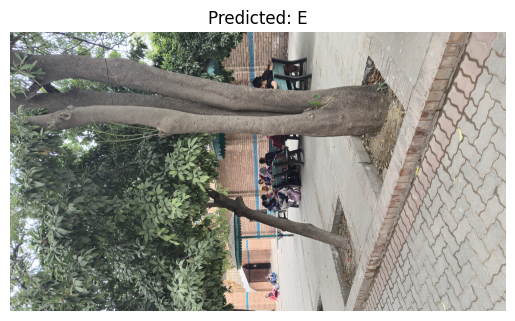

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


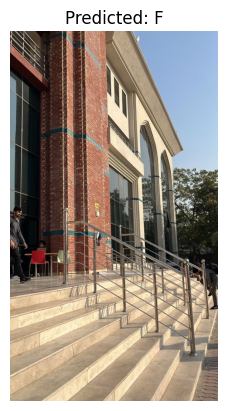

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


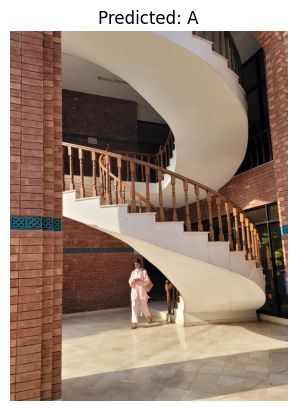

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


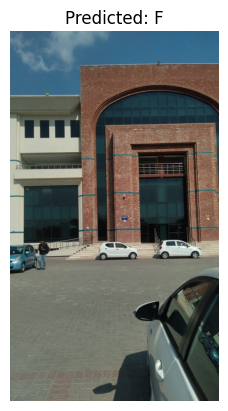

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


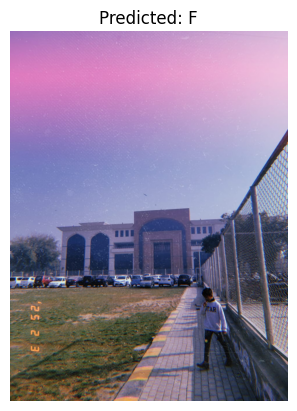

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


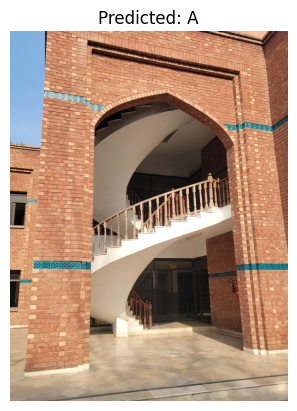

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


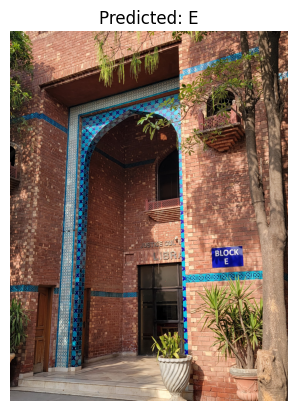

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


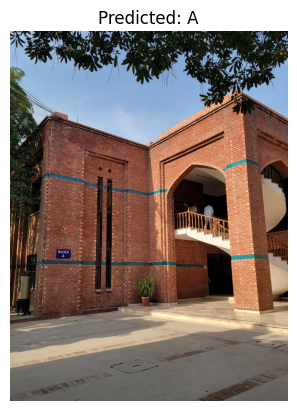

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


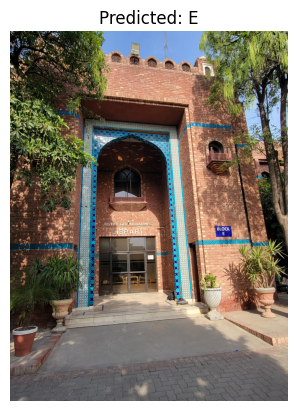

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


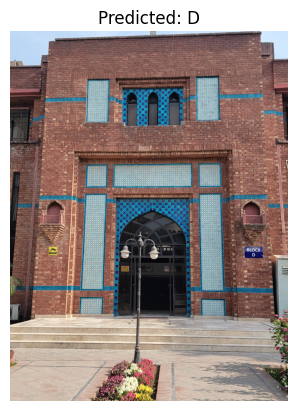

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


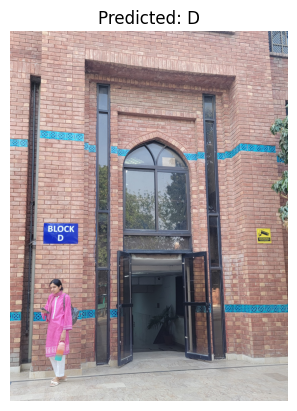

Image: F-250.jpg ➜ Predicted label: D
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


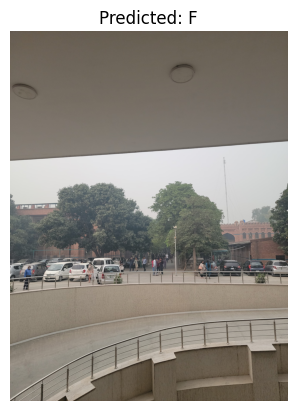

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


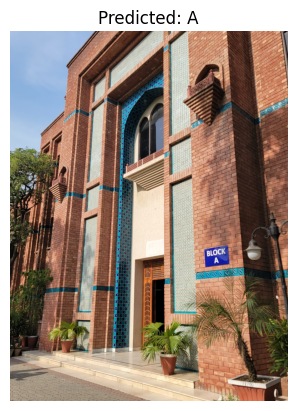

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


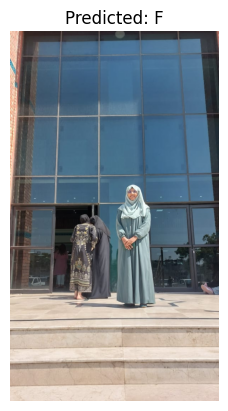

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


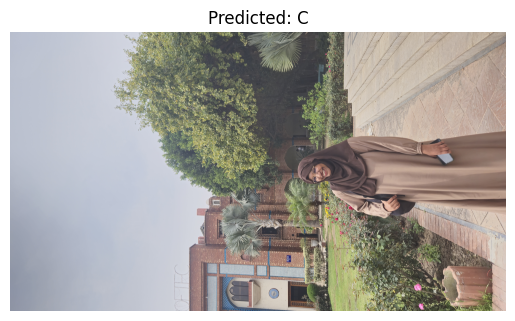

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


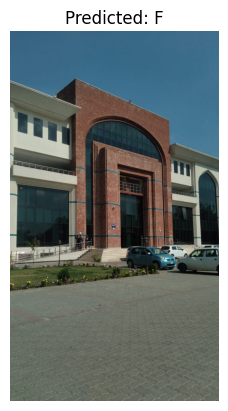

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


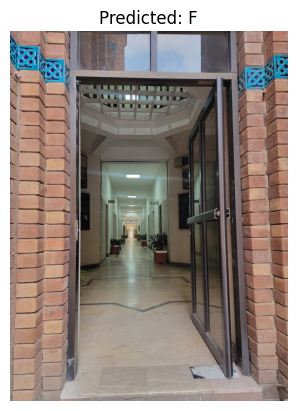

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


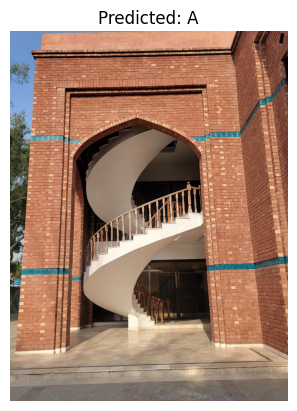

Image: F-250.jpg ➜ Predicted label: A
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


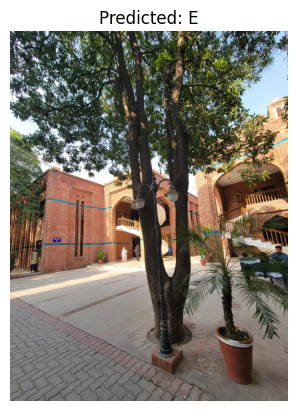

Image: F-250.jpg ➜ Predicted label: E
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


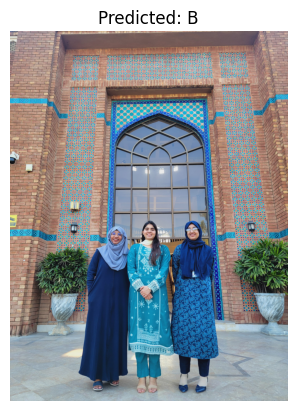

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


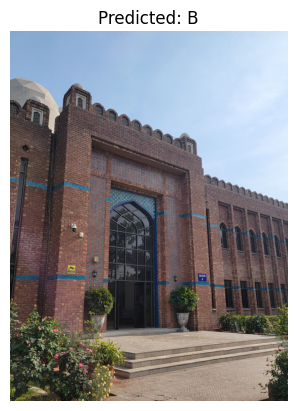

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


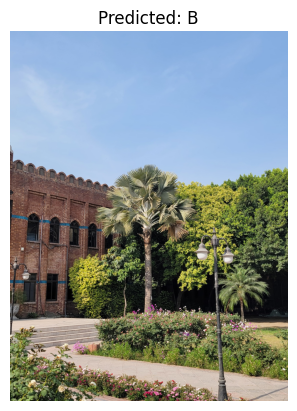

Image: F-250.jpg ➜ Predicted label: B
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


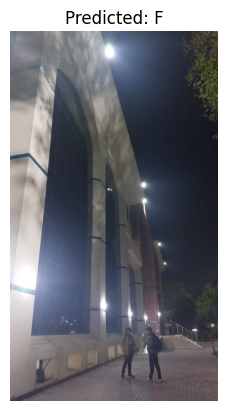

Image: F-250.jpg ➜ Predicted label: F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


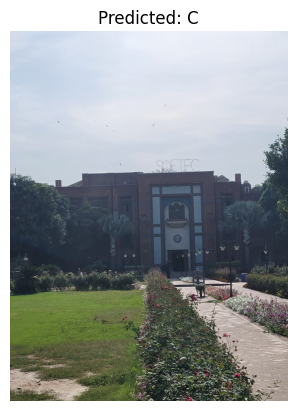

Image: F-250.jpg ➜ Predicted label: C
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


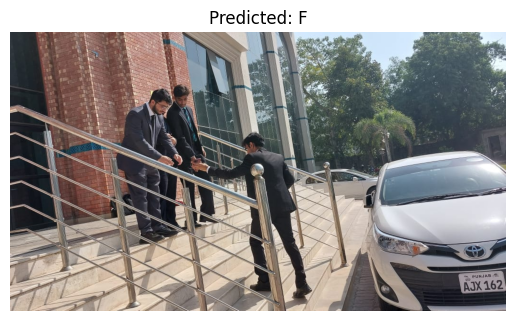

Image: F-250.jpg ➜ Predicted label: F


In [31]:
import zipfile

zip_path = '/content/testimages.zip'
extract_folder = '/content/test_images'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

image_files = []
for root, dirs, files in os.walk(extract_folder):
    for f in files:
        if f.lower().endswith(('.jpg', '.png', '.jpeg')):
            image_files.append(os.path.join(root, f))

for img_path in image_files:
    img_cv = cv2.imread(img_path)
    if img_cv is None:
        print(f"Skipping unreadable image: {img_name}")
        continue

    img_cv = adjust_lighting(img_cv)

    if random.random() < 0.3:
        img_cv = random_blur(img_cv)

    temp_path = '/content/temp.jpg'
    cv2.imwrite(temp_path, img_cv)

    img_input = preprocess_image(temp_path)
    prediction = model.predict(img_input)
    predicted_class = np.argmax(prediction, axis=1)[0]
    predicted_label = inverse_label_map[predicted_class]

    plt.imshow(Image.open(img_path))
    plt.axis('off')
    plt.title(f'Predicted: {predicted_label}')
    plt.show()
    print(f"Image: {img_name} ➜ Predicted label: {predicted_label}")


# Saving Model

In [32]:
model.save('/content/FAST_buildings_model.h5')